# Exploratory data analysis (part 2)
EDA on Santander customer transition prediction

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import sys

df_train = pd.read_csv('train.csv', header = 0, index_col = 0)

## correlation matrix of y=1 only
* correlation among features is larger than the case when y=0

In [12]:
corr_mat = df_train.loc[mask_pos,:].corr() 
off_diag = corr_mat.values-np.diag(np.diag(corr_mat.values))
print('min of correlation among features = %f' % off_diag[1:,1:].min())
print('max of correlation among features = %f' % off_diag[1:,1:].max())
# show correlation matrix
corr_mat.style.background_gradient(cmap='coolwarm').set_precision(2)

min of correlation among features = -0.028243
max of correlation among features = 0.027719


C:\Users\Calry\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\colors.py:504: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


# Mean and Standard Deviation of each feature
* some feature has huge standard deviation, e.g. var_160, var_187, etc. (maybe impportant)
* some feature has very small standard deviation, e.g. var_12, var_25, etc. (maybe less important)

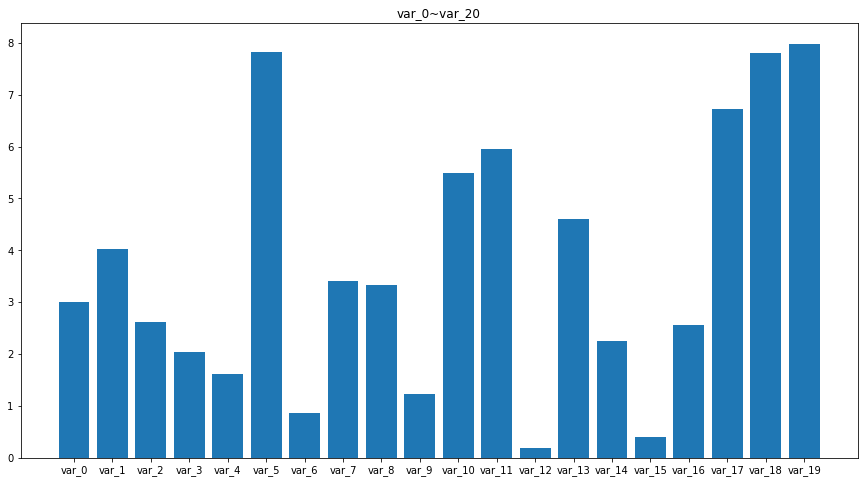

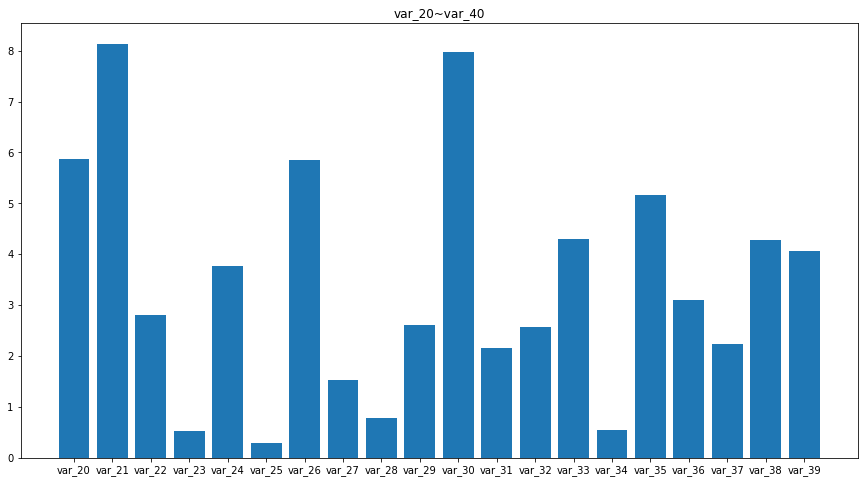

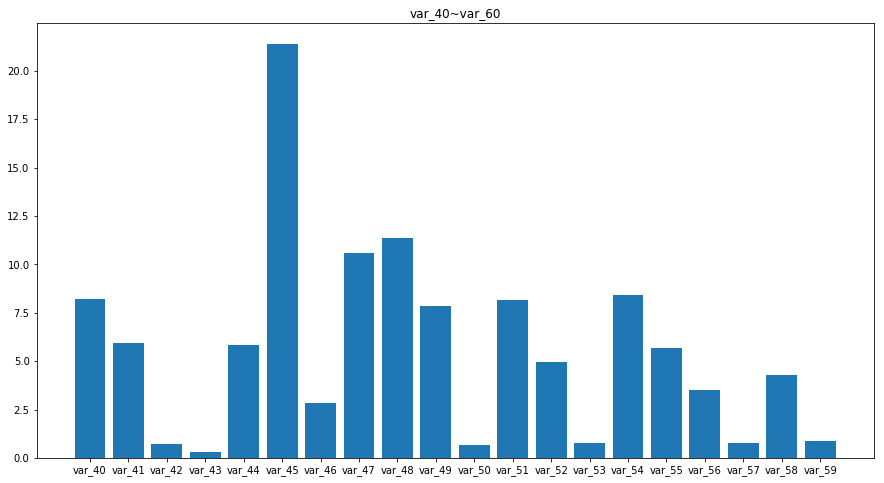

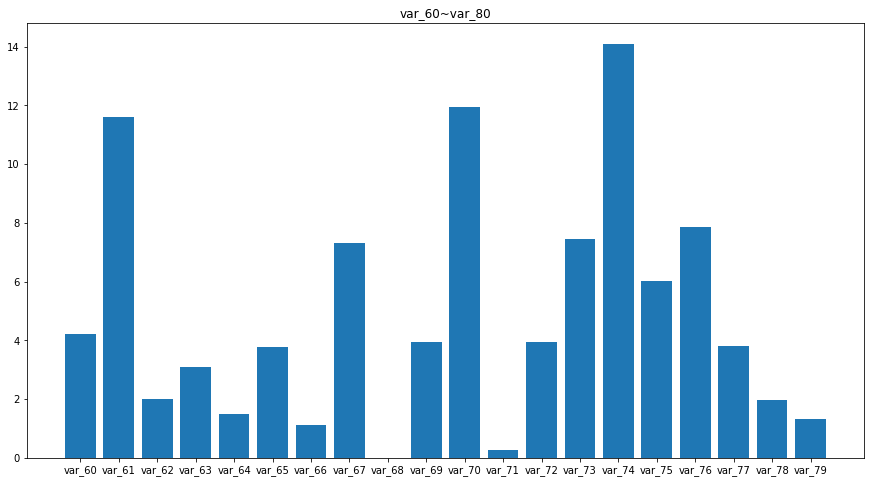

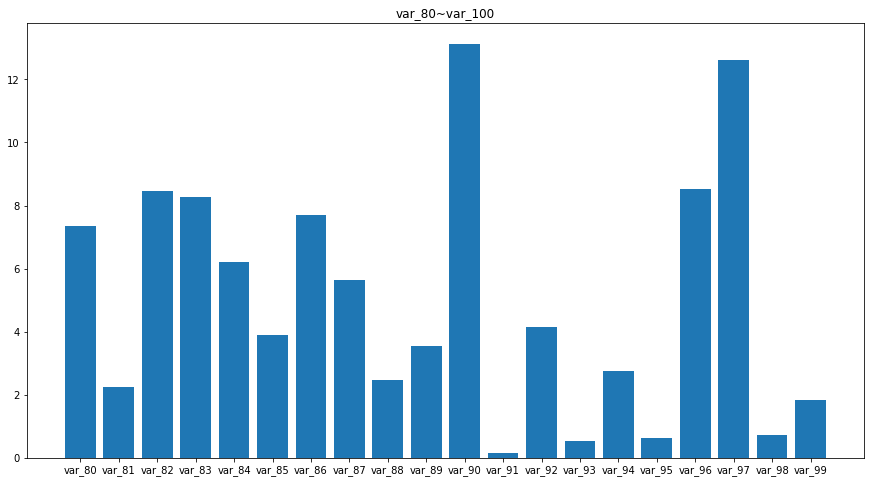

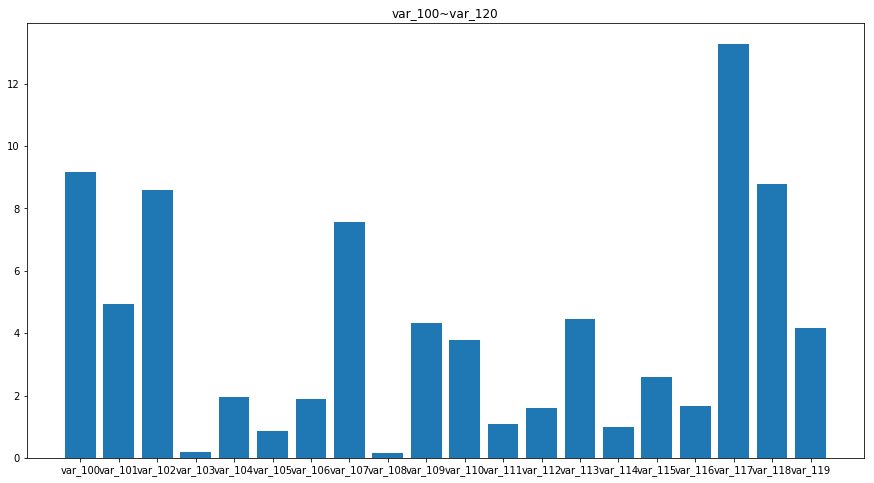

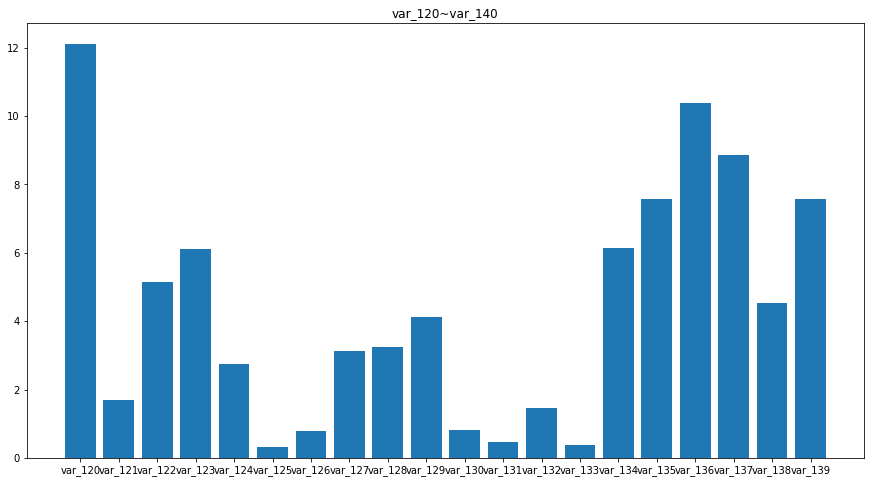

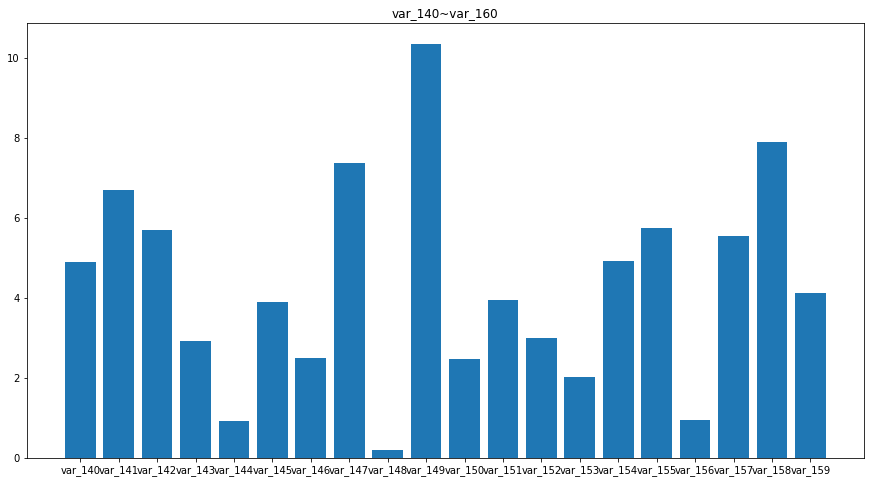

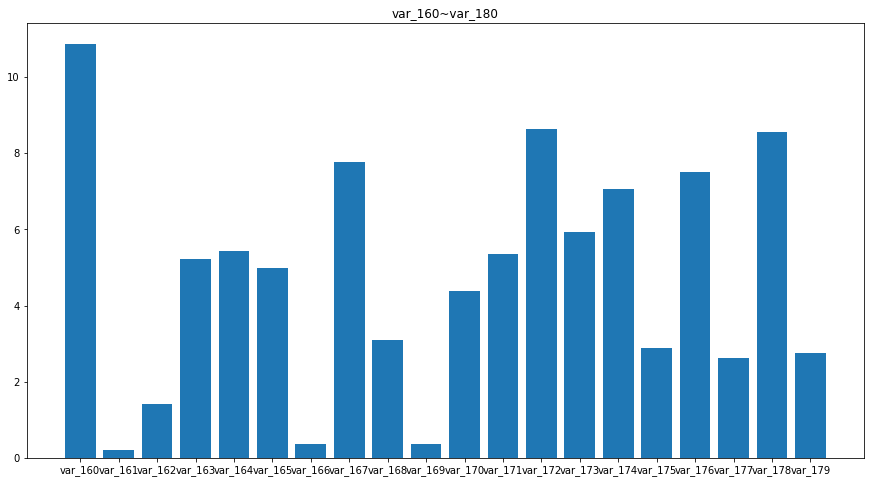

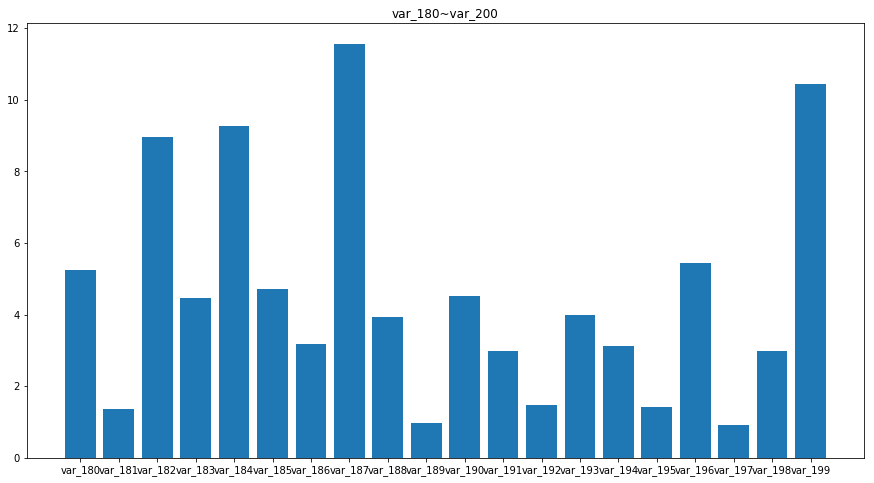

In [4]:
mask_neg = df_train.loc[:,'target']==0
mask_pos = df_train.loc[:,'target']==1

feature_std = df_train.values[mask_neg,1:].std(axis = 0)
feature_mean = df_train.values[mask_neg,1:].mean(axis = 0)
for n in range(10):
    fig = plt.figure(figsize=(15,8))
    ax = fig.add_subplot(1,1,1)
    ax.bar(['var_'+str(m) for m in range(n*20,(n+1)*20)], feature_std[n*20:(n+1)*20])
    #ax.bar(['var_'+str(m) for m in range(n*20,(n+1)*20)], feature_mean[n*20:(n+1)*20], yerr= feature_std[n*20:(n+1)*20])
    ax.set_title('var_'+str(n*20)+'~var_'+str((n+1)*20))
plt.show()

# Analysis of probability density of different target value
* all features looks like a Gaussian with noise
* y=1 looks more noisy (sharp peaks) than y=0
* some features could be binary categorical feature with noise

 80%|████████████████████████████████████████████████████████████████                | 160/200 [02:49<00:52,  1.32s/it]C:\Users\Calry\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
100%|████████████████████████████████████████████████████████████████████████████████| 200/200 [03:37<00:00,  1.01s/it]


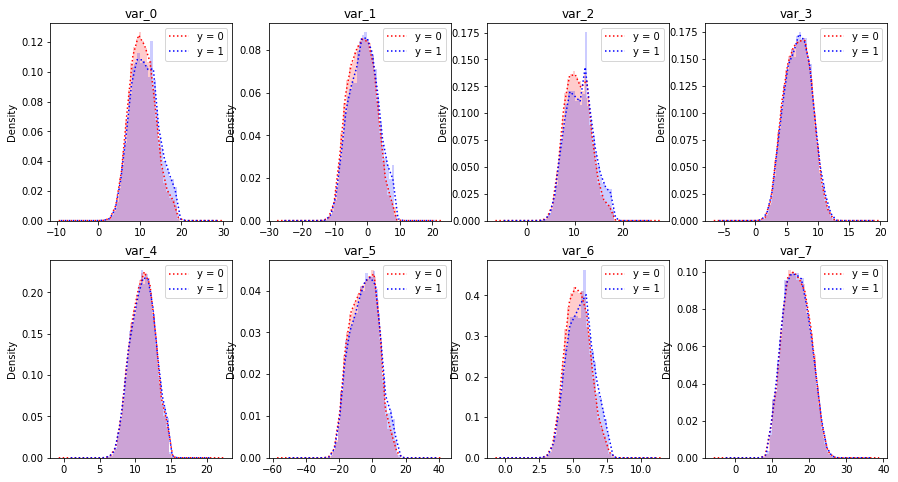

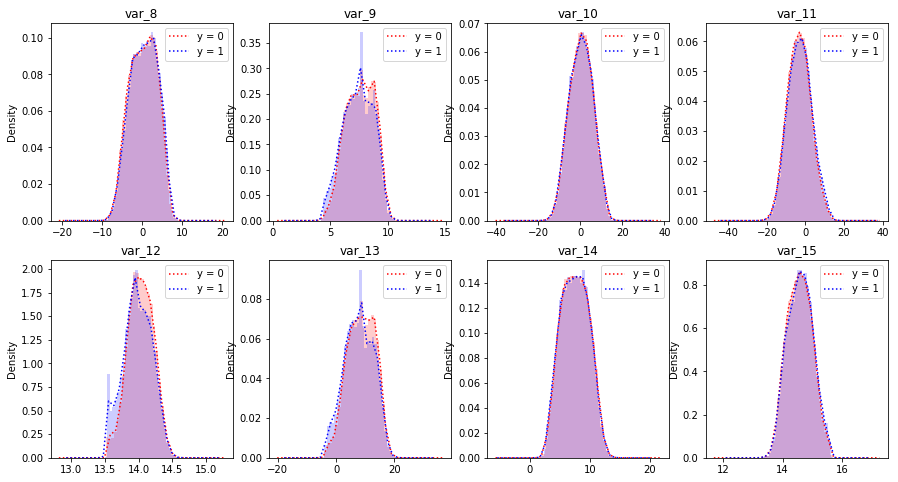

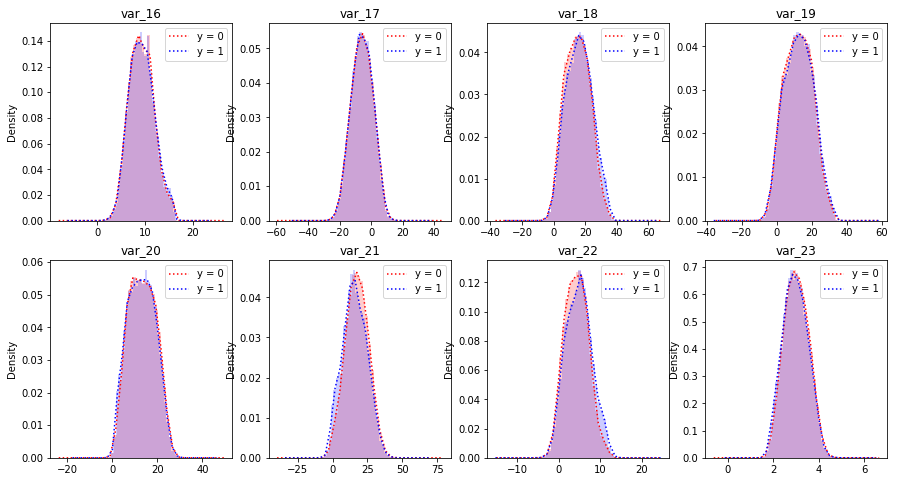

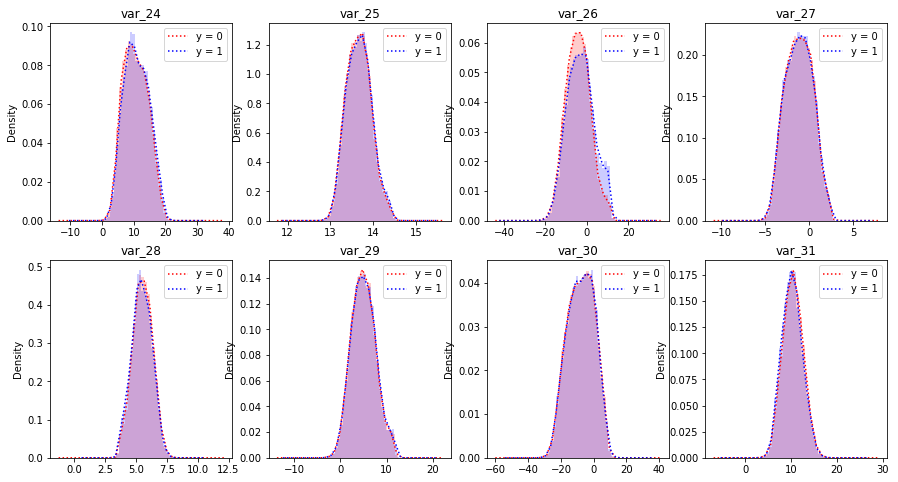

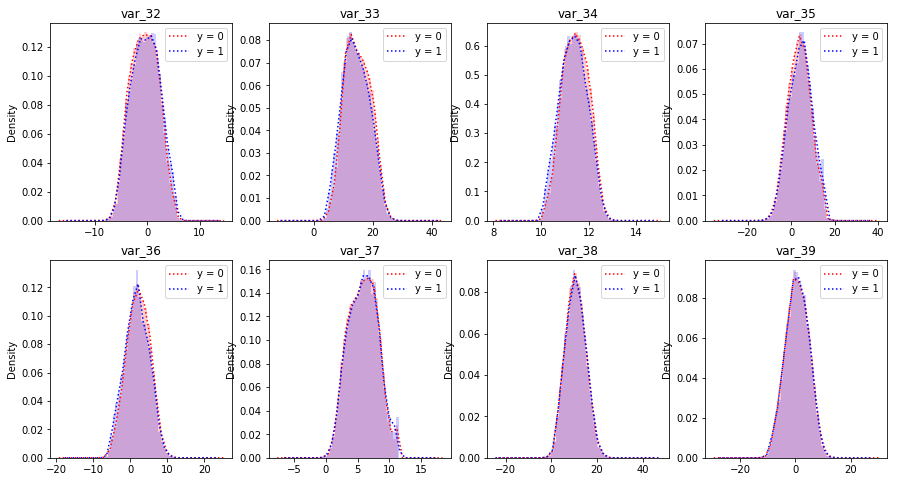

...

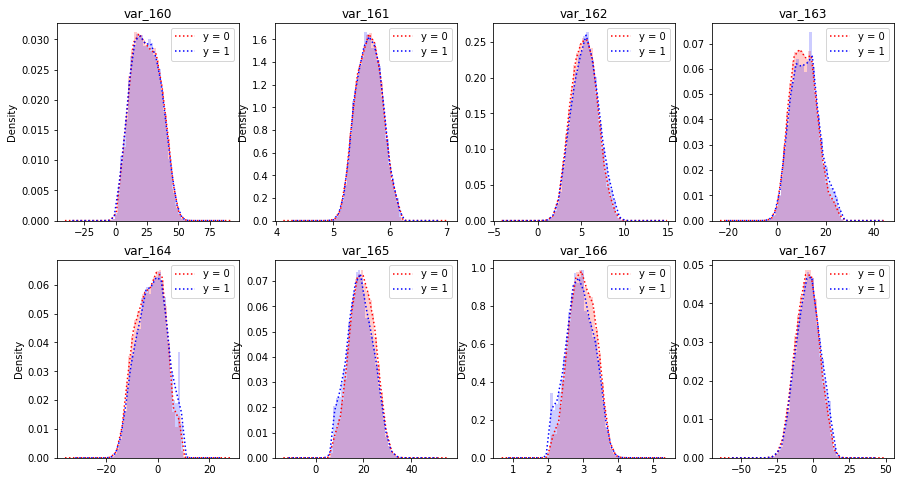

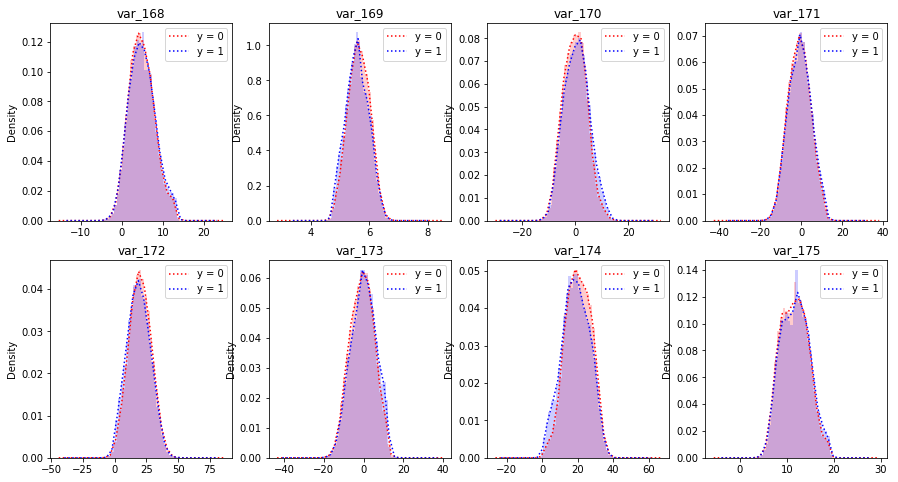

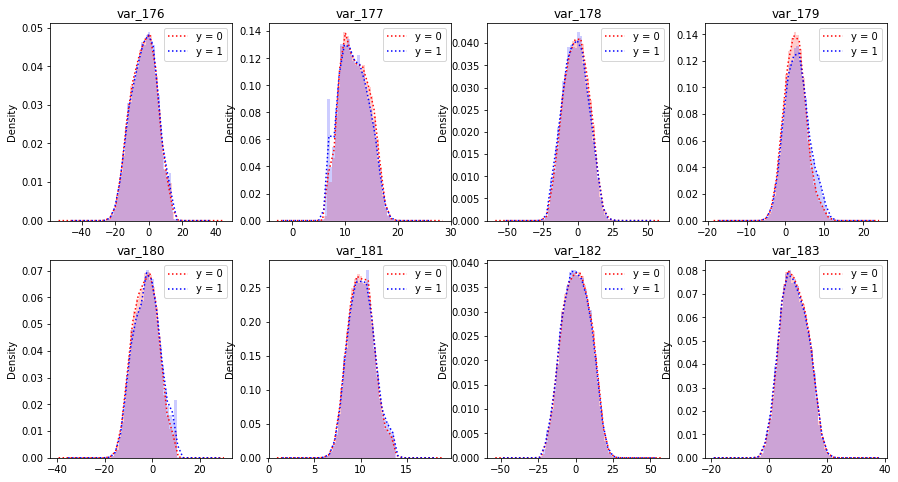

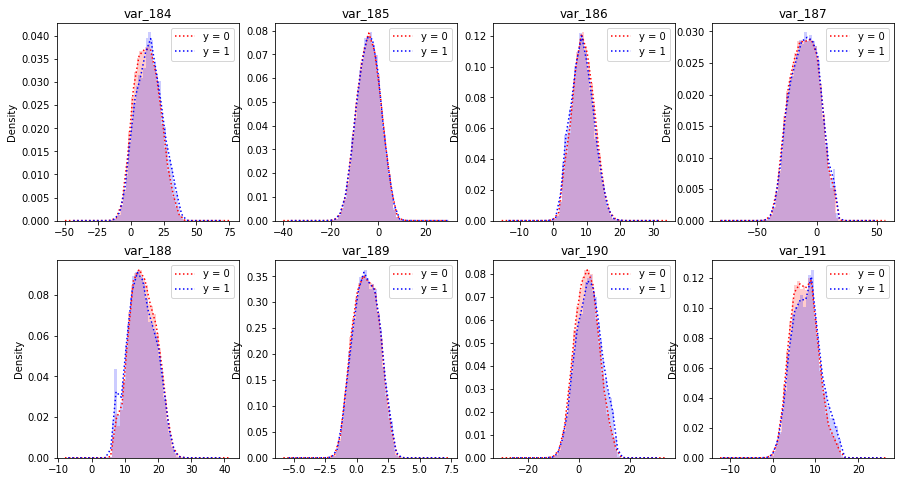

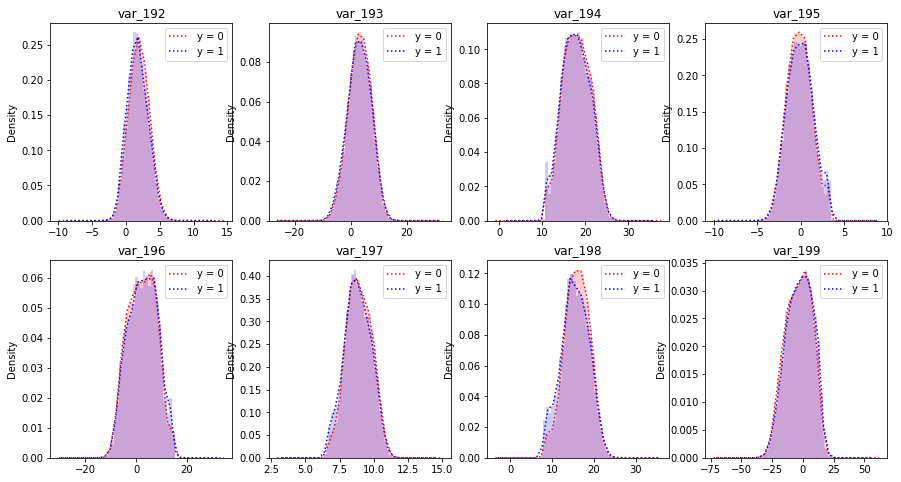

In [5]:
for n in tqdm(range(200)):
    ser_neg = df_train.loc[mask_neg,'var_'+str(n)]
    ser_pos = df_train.loc[mask_pos,'var_'+str(n)]
    
    if n % 8 == 0:
        fig = plt.figure(figsize=(15,8))
    ax = fig.add_subplot(2,4,n % 8+1)
    ser_neg.plot.hist(bins = 30, ax = ax, density = True, fc=(1, 0, 0, 0.2))
    ser_pos.plot.hist(bins = 30, ax = ax, density = True, fc=(0, 0, 1, 0.2))

    ser_neg.plot.kde(ind = 30, ax = ax, color = 'r', linestyle = 'dotted')
    ser_pos.plot.kde(ind = 30, ax = ax, color = 'b', linestyle = 'dotted')

    ax.legend(['y = 0', 'y = 1'])
    ax.set_title('var_'+str(n))
plt.show()

# Simple Logistic Regression

In [7]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split

### split data set 

In [8]:
train_data_x = df_train.iloc[:,1:].values
train_data_y = df_train.iloc[:,0].values

x_train, x_test, y_train, y_test = train_test_split(train_data_x, train_data_y, test_size=0.20)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.20)
print('train set', x_train.shape, y_train.shape)
print('validation set', x_val.shape, y_val.shape)
print('test set', x_test.shape, y_test.shape)

train set (128000, 200) (128000,)
validation set (32000, 200) (32000,)
test set (40000, 200) (40000,)


### train model

In [9]:
# fit model
model = LogisticRegression(solver = 'lbfgs', verbose = 1, n_jobs = -1)
model.fit(x_train, y_train)

[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:  1.2min finished


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=-1,
          penalty='l2', random_state=None, solver='lbfgs', tol=0.0001,
          verbose=1, warm_start=False)

### predict 
* get AUC around 0.85

In [10]:
# predict on different sets
y_train_pred = model.predict_proba(x_train)
y_val_pred = model.predict_proba(x_val)
y_test_pred = model.predict_proba(x_test)

# metrics on different sets            
print('auc on train', roc_auc_score(y_train, y_train_pred[:,1]))     
print('auc on val', roc_auc_score(y_val, y_val_pred[:,1]))
print('auc on test', roc_auc_score(y_test, y_test_pred[:,1]))

auc on train 0.8519787021434828
auc on val 0.8440824552211137
auc on test 0.8456352853613351
